# Rotten Tomatoes Movies Rating Prediction
source: https://platform.stratascratch.com/data-projects/rotten-tomatoes-movies-rating-prediction

In [25]:
import pandas as pd
import numpy as np
import shap

import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from catboost import CatBoostClassifier
from sklearn import set_config
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import PartialDependenceDisplay
import sklearn.metrics as skm

set_config(transform_output="pandas")
%matplotlib inline


### (1) Load datasets

In [26]:
movies = pd.read_csv("./datasets/rotten_tomatoes_movies.csv")
print(movies.info())

# Is the data set unique by rotten_tomatoes_link? - Yes
assert movies.drop_duplicates(["rotten_tomatoes_link"]).shape[0] == movies.shape[0]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17712 entries, 0 to 17711
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   rotten_tomatoes_link              17712 non-null  object 
 1   movie_title                       17712 non-null  object 
 2   movie_info                        17391 non-null  object 
 3   critics_consensus                 9134 non-null   object 
 4   content_rating                    17712 non-null  object 
 5   genres                            17693 non-null  object 
 6   directors                         17518 non-null  object 
 7   authors                           16170 non-null  object 
 8   actors                            17360 non-null  object 
 9   original_release_date             16546 non-null  object 
 10  streaming_release_date            17328 non-null  object 
 11  runtime                           17398 non-null  float64
 12  prod

In [27]:
critics = pd.read_csv("./datasets/rotten_tomatoes_critic_reviews_50k.csv")
critics.info()
critics

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   rotten_tomatoes_link  50000 non-null  object
 1   critic_name           48068 non-null  object
 2   top_critic            50000 non-null  bool  
 3   publisher_name        50000 non-null  object
 4   review_type           50000 non-null  object
 5   review_score          36409 non-null  object
 6   review_date           50000 non-null  object
 7   review_content        41195 non-null  object
dtypes: bool(1), object(7)
memory usage: 2.7+ MB


,rotten_tomatoes_link,critic_name,top_critic,publisher_name,review_type,review_score,review_date,review_content
0,m/0814255,Andrew L. Urban,False,Urban Cinefile,Fresh,NaN,2010-02-06,A fantasy adventure that fuses Greek mythology...
1,m/0814255,Louise Keller,False,Urban Cinefile,Fresh,NaN,2010-02-06,"Uma Thurman as Medusa, the gorgon with a coiff..."
2,m/0814255,NaN,False,FILMINK (Australia),Fresh,NaN,2010-02-09,With a top-notch cast and dazzling special eff...
3,m/0814255,Ben McEachen,False,Sunday Mail (Australia),Fresh,3.5/5,2010-02-09,Whether audiences will get behind The Lightnin...
4,m/0814255,Ethan Alter,True,Hollywood Reporter,Rotten,NaN,2010-02-10,What's really lacking in The Lightning Thief i...
...,...,...,...,...,...,...,...,...
49995,m/1110242-collateral_damage,Chris Hewitt,False,St. Paul Pioneer Press,Rotten,NaN,2002-02-07,The smarter an Arnold Schwarzenegger movie tri...
49996,m/1110242-collateral_damage,Nick Carter,False,Milwaukee Journal Sentinel,Rotten,NaN,2002-02-07,A relative letdown.
49997,m/1110242-collateral_damage,Gary Dowell,True,Dallas Morning News,Rotten,NaN,2002-02-07,The movie straddles the fence between escapism...
49998,m/1110242-collateral_damage,Walter Chaw,False,Film Freak Central,Rotten,0/4,2002-02-07,Enough similarities to Gymkata and Howie Long'...


### (2) Feature engineering

#### Should we include critics data set information in the analysis? 

In [28]:
critics_review = critics.groupby("rotten_tomatoes_link", as_index=False).agg(
    n_critics=("critic_name", "nunique"),
    n_top=("top_critic", "sum"),
    n_fresh=("review_type", lambda x: sum(np.where(x == "Fresh", 1, 0))),
    n_rotten=("review_type", lambda x: sum(np.where(x == "Rotten", 1, 0))),
)

critics_review

,rotten_tomatoes_link,n_critics,n_top,n_fresh,n_rotten
0,m/0814255,146,43,73,76
1,m/0878835,141,44,123,19
2,m/10,23,2,16,8
3,m/1000013-12_angry_men,51,6,54,0
4,m/1000079-20000_leagues_under_the_sea,25,5,24,3
...,...,...,...,...,...
1361,m/1109942-big_trouble,108,33,54,58
1362,m/1110008-sidewalks_of_new_york,90,26,53,41
1363,m/1110048-pornographer,7,0,3,5
1364,m/1110236-wash,45,19,4,46


The critics data set is largely incomplete, and the aggregated values do not agree with the movies data set.
I will not incorporate this data set in the analysis

In [29]:
movies2 = movies.merge(critics_review, on="rotten_tomatoes_link", how="left")
print(movies2.isna().sum())
movies2.query("tomatometer_top_critics_count != n_top and n_critics.notna()")[
    [
        "rotten_tomatoes_link",
        "n_critics",
        "tomatometer_top_critics_count",
        "tomatometer_fresh_critics_count",
        "tomatometer_rotten_critics_count",
        "n_top",
        "n_fresh",
        "n_rotten",
    ]
].head(5)

rotten_tomatoes_link                    0
movie_title                             0
movie_info                            321
critics_consensus                    8578
content_rating                          0
genres                                 19
directors                             194
authors                              1542
actors                                352
original_release_date                1166
streaming_release_date                384
runtime                               314
production_company                    499
tomatometer_status                     44
tomatometer_rating                     44
tomatometer_count                      44
audience_status                       448
audience_rating                       296
audience_count                        297
tomatometer_top_critics_count           0
tomatometer_fresh_critics_count         0
tomatometer_rotten_critics_count        0
n_critics                           16346
n_top                             

,rotten_tomatoes_link,n_critics,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,n_top,n_fresh,n_rotten
85,m/10007985-happening,180.0,42,32,151,43.0,32.0,149.0
150,m/10009210-duchess_of_langeais,65.0,30,46,20,31.0,46.0,20.0
232,m/10011050-lake_mungo,18.0,2,20,1,0.0,17.0,1.0
237,m/10011235-fame,117.0,36,29,93,37.0,29.0,93.0
555,m/1011813-lady_vanishes,41.0,7,43,1,8.0,43.0,1.0


In [30]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17712 entries, 0 to 17711
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   rotten_tomatoes_link              17712 non-null  object 
 1   movie_title                       17712 non-null  object 
 2   movie_info                        17391 non-null  object 
 3   critics_consensus                 9134 non-null   object 
 4   content_rating                    17712 non-null  object 
 5   genres                            17693 non-null  object 
 6   directors                         17518 non-null  object 
 7   authors                           16170 non-null  object 
 8   actors                            17360 non-null  object 
 9   original_release_date             16546 non-null  object 
 10  streaming_release_date            17328 non-null  object 
 11  runtime                           17398 non-null  float64
 12  prod

In [31]:
movies2 = movies.assign(
    pct_critic_fresh=lambda x: x.tomatometer_fresh_critics_count
    / (x.tomatometer_fresh_critics_count + x.tomatometer_rotten_critics_count)
).dropna(subset="tomatometer_status")

In [32]:
print(movies2.pct_critic_fresh.corr(movies2.tomatometer_rating))
movies2[["pct_critic_fresh", "tomatometer_rating"]]

0.9999365604734362


,pct_critic_fresh,tomatometer_rating
0,0.489933,49.0
1,0.866197,87.0
2,0.666667,67.0
3,1.000000,100.0
4,0.888889,89.0
...,...,...
17707,0.555556,56.0
17708,0.976027,98.0
17709,0.800000,80.0
17710,0.956522,96.0


It turned out that the tomatometer rating is computed exactly as percentage of 'fresh' rating (fresh cretics count / total critics reviews). We don't need the newly created pct_critic_fresh variable.

### (3) EDA

In [33]:
movies2.describe()

,runtime,tomatometer_rating,tomatometer_count,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,pct_critic_fresh
count,17384.000000,17668.000000,17668.000000,17407.000000,1.740600e+04,17668.000000,17668.000000,17668.000000,17654.000000
mean,102.220490,60.884763,57.139801,60.556385,1.440142e+05,14.605332,36.419572,20.730869,0.608970
std,18.692232,28.443348,68.370047,20.538600,1.764030e+06,15.153173,52.645542,30.266383,0.284258
min,5.000000,0.000000,5.000000,0.000000,5.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,90.000000,38.000000,12.000000,45.000000,7.090000e+02,3.000000,6.000000,3.000000,0.384615
50%,99.000000,67.000000,28.000000,63.000000,4.285000e+03,8.000000,16.000000,8.000000,0.666667
75%,111.000000,86.000000,75.000000,78.000000,2.508850e+04,23.000000,44.000000,24.000000,0.857143
max,266.000000,100.000000,574.000000,100.000000,3.579764e+07,69.000000,497.000000,303.000000,1.000000


In [34]:
ProfileReport(movies)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
movies2.isna().sum()

rotten_tomatoes_link                   0
movie_title                            0
movie_info                           291
critics_consensus                   8534
content_rating                         0
genres                                19
directors                            193
authors                             1534
actors                               352
original_release_date               1154
streaming_release_date               352
runtime                              284
production_company                   493
tomatometer_status                     0
tomatometer_rating                     0
tomatometer_count                      0
audience_status                      413
audience_rating                      261
audience_count                       262
tomatometer_top_critics_count          0
tomatometer_fresh_critics_count        0
tomatometer_rotten_critics_count       0
pct_critic_fresh                      14
dtype: int64

In [36]:
numVars = movies2.select_dtypes(exclude="object").columns.to_list()
numVars

['runtime',
 'tomatometer_rating',
 'tomatometer_count',
 'audience_rating',
 'audience_count',
 'tomatometer_top_critics_count',
 'tomatometer_fresh_critics_count',
 'tomatometer_rotten_critics_count',
 'pct_critic_fresh']

0 runtime
1 tomatometer_rating
2 tomatometer_count
3 audience_rating
4 audience_count
5 tomatometer_top_critics_count
6 tomatometer_fresh_critics_count
7 tomatometer_rotten_critics_count
8 pct_critic_fresh


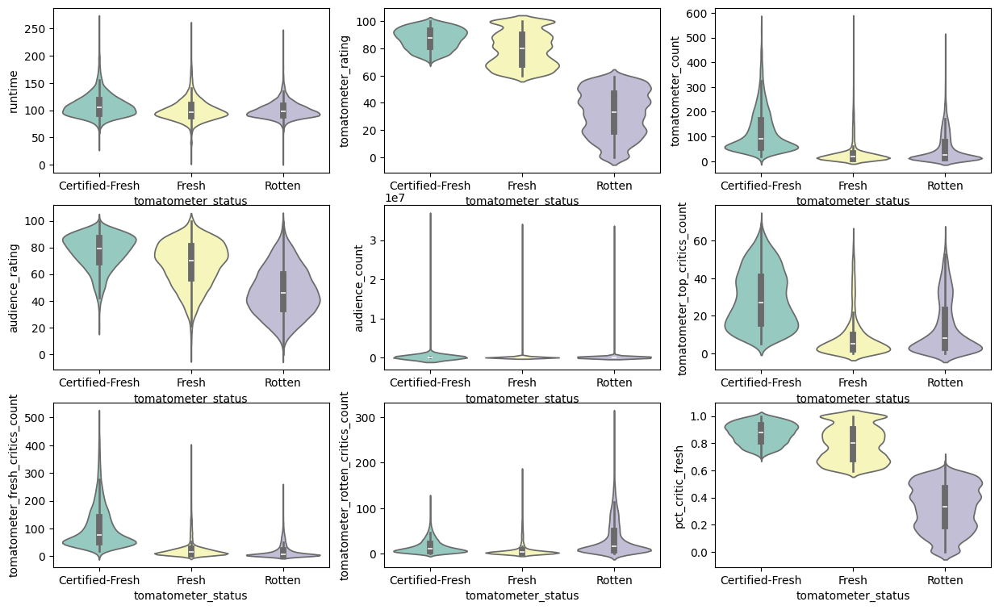

In [37]:
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(15, 9))
axes = axes.flatten()

movies2 = movies2.sort_values("tomatometer_status")
for n, i in enumerate(numVars):
    print(n, i)
    sns.violinplot(
        movies2,
        y=i,
        x="tomatometer_status",
        ax=axes[n],
        hue="tomatometer_status",
        palette="Set3",
    )


In [38]:
catVars = movies.select_dtypes("object").columns.to_list()

for var in catVars:
    print(f"{var} {movies[var].nunique()} : {movies[var].unique()[0:10]}")

rotten_tomatoes_link 17712 : ['m/0814255' 'm/0878835' 'm/10' 'm/1000013-12_angry_men'
 'm/1000079-20000_leagues_under_the_sea' 'm/10000_bc' 'm/1000121-39_steps'
 'm/1000123-310_to_yuma' 'm/10002008-charly' 'm/1000204-abraham_lincoln']
movie_title 17106 : ['Percy Jackson & the Olympians: The Lightning Thief' 'Please Give' '10'
 '12 Angry Men (Twelve Angry Men)' '20,000 Leagues Under The Sea'
 '10,000 B.C.' 'The 39 Steps' '3:10 to Yuma' 'Charly (A Heartbeat Away)'
 'Abraham Lincoln']
movie_info 17389 : ["Always trouble-prone, the life of teenager Percy Jackson (Logan Lerman) gets a lot more complicated when he learns he's the son of the Greek god Poseidon. At a training ground for the children of deities, Percy learns to harness his divine powers and prepare for the adventure of a lifetime: he must prevent a feud among the Olympians from erupting into a devastating war on Earth, and rescue his mother from the clutches of Hades, god of the underworld."
 "Kate (Catherine Keener) and her hu

### (4) CATboost

In [39]:
targetVar = "tomatometer_status"
# pct_critic_fresh is 100% correlated with tomatometer_rating
numPreds = [x for x in numVars if x != "pct_critic_fresh"]
catPreds = ["content_rating", "audience_status"]
allPreds = numPreds + catPreds

colTF = ColumnTransformer(
    [
        ("numPreds", SimpleImputer(strategy="median"), numPreds),
        ("catPreds", SimpleImputer(strategy="most_frequent"), catPreds),
    ],
)

moviesTF = colTF.fit_transform(movies2)

In [40]:
X = moviesTF
y = movies2[targetVar]

X_learn, X_val, y_learn, y_val = train_test_split(X, y, test_size=0.25)
X_train, X_eval, y_train, y_eval = train_test_split(X_learn, y_learn, test_size=0.25)

print(f"""
{X.shape=} {y.shape=}
{X_learn.shape=} {y_learn.shape=}
{X_train.shape=} {y_train.shape=}
{X_eval.shape=} {y_eval.shape=}
""")


X.shape=(17668, 10) y.shape=(17668,)
X_learn.shape=(13251, 10) y_learn.shape=(13251,)
X_train.shape=(9938, 10) y_train.shape=(9938,)
X_eval.shape=(3313, 10) y_eval.shape=(3313,)



#### Use Early stopping with default setups. Pick a learn_rate and n_estimator pair

In [41]:
catPredTF = [x for x in moviesTF.columns.to_list() if x.startswith("catPreds_")]
set_learn_rate = 0.05

catclf01 = CatBoostClassifier(
    learning_rate=set_learn_rate,
    n_estimators=5000,
    early_stopping_rounds=100,
    random_state=777,
    cat_features=catPredTF,
    objective="MultiClass",
    verbose=0,
)

catclf01.fit(X_train, y_train, eval_set=(X_eval, y_eval))

bestIteration = catclf01.best_iteration_

print(f"{bestIteration=}, {set_learn_rate=}")

bestIteration=801, set_learn_rate=0.05


#### Grid search cross validation other hyperparameters 


In [ ]:
nfold = 5

param_grid = {
    "depth": [3, 5, 7],
    "l2_leaf_reg": [0.1, 1, 5],
    "border_count": [32, 64, 128],
}

clf02 = CatBoostClassifier(
    learning_rate=set_learn_rate,
    n_estimators=bestIteration,
    random_state=777,
    cat_features=catPredTF,
    objective="MultiClass",
)

cbsearch = GridSearchCV(
    estimator=clf02,
    param_grid=param_grid,
    cv=nfold,
    n_jobs=-1,
    verbose=3,
    scoring="balanced_accuracy",
)

# cbsearch.fit(X_learn, y_learn)

print(f"{cbsearch.best_params_=}")
selected_clf = cbsearch.best_estimator_

In [46]:
bestIteration = 800
border_count = 128
depth = 3
l2_leaf_reg = 0.1

selected_clf = CatBoostClassifier(
    learning_rate=set_learn_rate,
    n_estimators=bestIteration,
    random_state=777,
    cat_features=catPredTF,
    objective="MultiClass",
    depth=depth,
    l2_leaf_reg=l2_leaf_reg,
    border_count=border_count,
)

selected_clf.fit(X_learn, y_learn)

0:	learn: 1.0059543	total: 15.4ms	remaining: 12.3s
1:	learn: 0.9252372	total: 30.5ms	remaining: 12.2s
2:	learn: 0.8535734	total: 53.3ms	remaining: 14.2s
3:	learn: 0.7923062	total: 67.5ms	remaining: 13.4s
4:	learn: 0.7358148	total: 84.2ms	remaining: 13.4s
5:	learn: 0.6879027	total: 100ms	remaining: 13.3s
6:	learn: 0.6436959	total: 117ms	remaining: 13.3s
7:	learn: 0.6035088	total: 134ms	remaining: 13.3s
8:	learn: 0.5670194	total: 154ms	remaining: 13.5s
9:	learn: 0.5328439	total: 171ms	remaining: 13.5s
10:	learn: 0.5014639	total: 193ms	remaining: 13.8s
11:	learn: 0.4715678	total: 211ms	remaining: 13.8s
12:	learn: 0.4447771	total: 230ms	remaining: 13.9s
13:	learn: 0.4203294	total: 249ms	remaining: 14s
14:	learn: 0.3979323	total: 270ms	remaining: 14.1s
15:	learn: 0.3767614	total: 289ms	remaining: 14.1s
16:	learn: 0.3566812	total: 306ms	remaining: 14.1s
17:	learn: 0.3377900	total: 324ms	remaining: 14.1s
18:	learn: 0.3203354	total: 341ms	remaining: 14s
19:	learn: 0.3039614	total: 359ms	remain

#### Validation evaluation

Balanced accuracy Score = 0.992
predicted        Certified-Fresh  Fresh  Rotten
actual                                         
Certified-Fresh              792     13       0
Fresh                         16   1707       0
Rotten                         0      0    1889


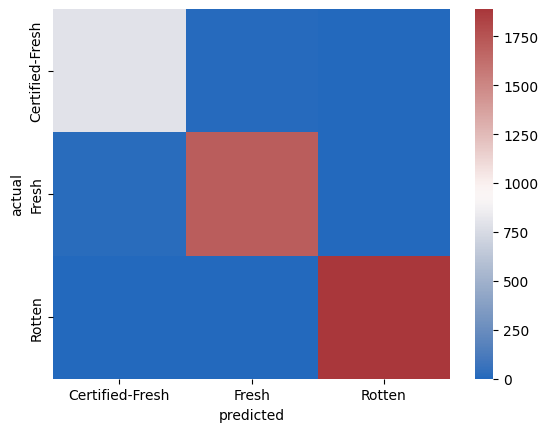

In [48]:
predicted = selected_clf.predict(X_val).flatten()
avp = pd.DataFrame({"actual": y_val, "predicted": predicted})
cm = pd.crosstab(avp.actual, avp.predicted)

print(
    f"Balanced accuracy Score = {skm.balanced_accuracy_score(avp.actual, avp.predicted):.3f}"
)
sns.heatmap(cm, cmap="vlag")
print(cm)

#### Variable importance

                                      Feature  Importance
1                numPreds__tomatometer_rating   58.819523
2                 numPreds__tomatometer_count   13.795999
6   numPreds__tomatometer_fresh_critics_count   11.888209
5     numPreds__tomatometer_top_critics_count    5.968675
7  numPreds__tomatometer_rotten_critics_count    2.526440
4                    numPreds__audience_count    1.967573
0                           numPreds__runtime    1.944180
3                   numPreds__audience_rating    1.942731
8                    catPreds__content_rating    0.991744
9                   catPreds__audience_status    0.154926


<Axes: xlabel='Importance', ylabel='Feature'>

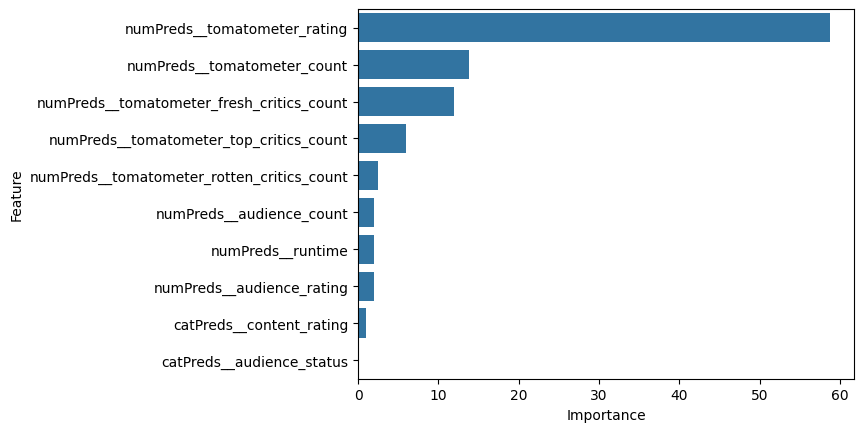

In [49]:
feature_importance = pd.DataFrame(
    {
        "Feature": X_train.columns.to_list(),
        "Importance": selected_clf.get_feature_importance(),
    }
)

feature_importance = feature_importance.sort_values("Importance", ascending=False)

print(feature_importance)

sns.barplot(feature_importance, y="Feature", x="Importance")

#### Partial dependency plot

Text(0.5, 0.98, 'Target = Rotten')

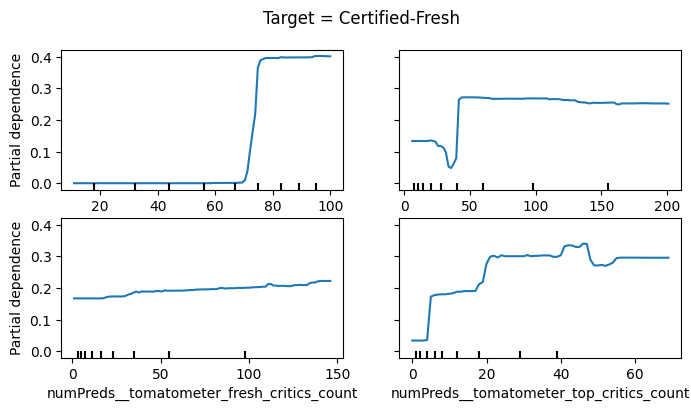

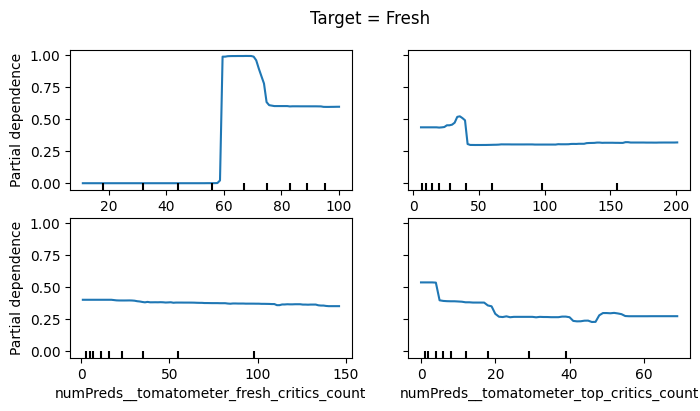

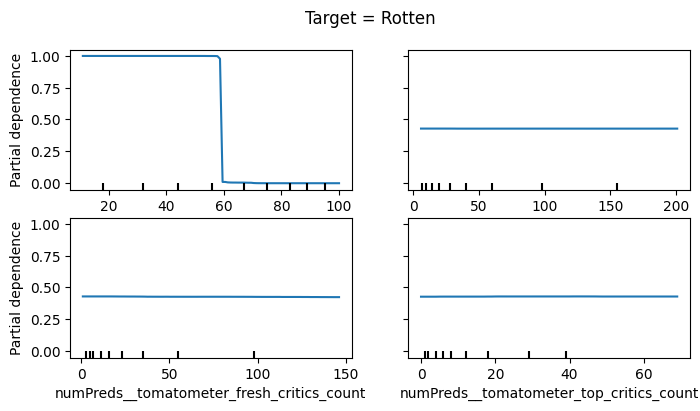

In [50]:
fig, ax = plt.subplots(2, 2, figsize=(8, 4))
PartialDependenceDisplay.from_estimator(
    selected_clf,
    X_learn,
    features=feature_importance.iloc[0:4]["Feature"],
    target="Certified-Fresh",
    n_cols=2,
    ax=ax,
)
fig.suptitle("Target = Certified-Fresh")

fig, ax = plt.subplots(2, 2, figsize=(8, 4))
PartialDependenceDisplay.from_estimator(
    selected_clf,
    X_learn,
    features=feature_importance.iloc[0:4]["Feature"],
    target="Fresh",
    n_cols=2,
    ax=ax,
)
fig.suptitle("Target = Fresh")

fig, ax = plt.subplots(2, 2, figsize=(8, 4))
PartialDependenceDisplay.from_estimator(
    selected_clf,
    X_learn,
    features=feature_importance.iloc[0:4]["Feature"],
    target="Rotten",
    n_cols=2,
    ax=ax,
)
fig.suptitle("Target = Rotten")

#### SHAP

In [96]:
selected_clf.classes_

array(['Certified-Fresh', 'Fresh', 'Rotten'], dtype=object)

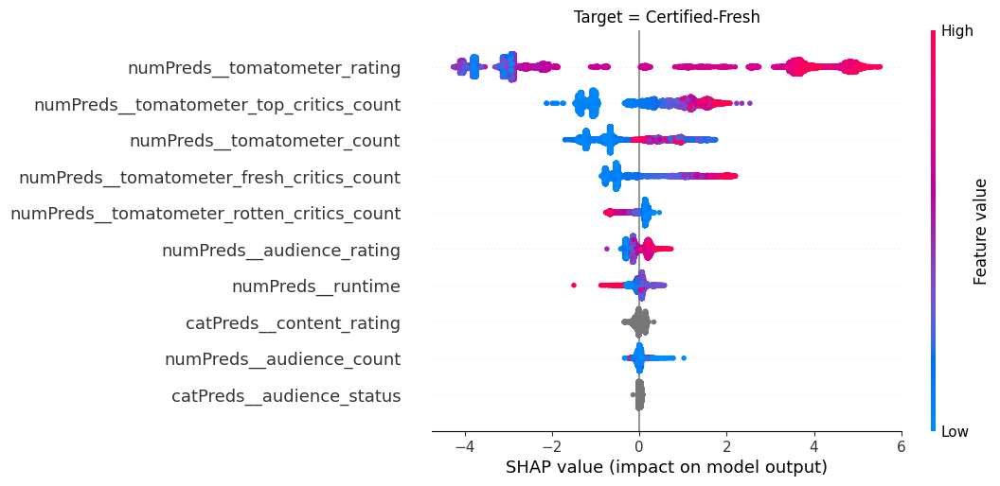

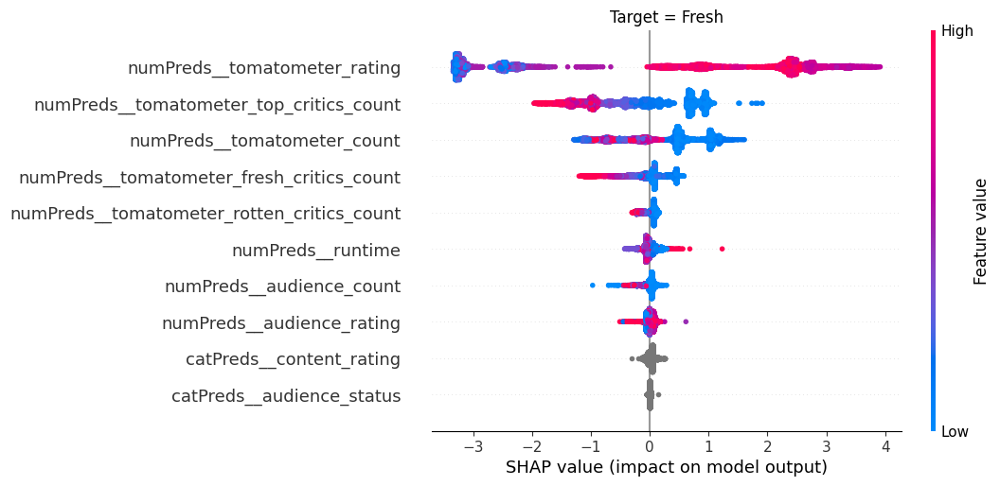

Text(0.5, 1.0, 'Target = Rotten')

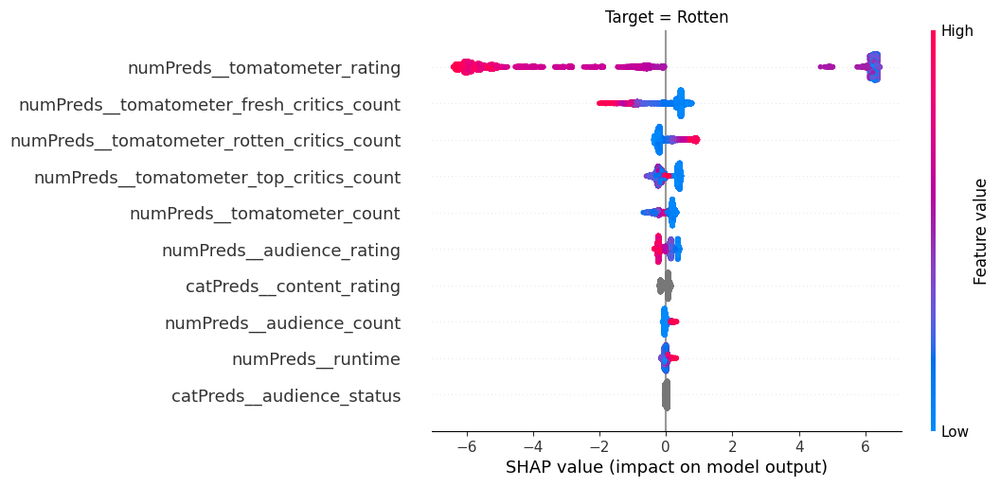

In [ ]:
explainer = shap.TreeExplainer(selected_clf)
shap_values = explainer(X_learn)
shap.plots.beeswarm(shap_values[:, :, 0], show=False)
plt.title("Target = Certified-Fresh")
plt.show()
shap.plots.beeswarm(shap_values[:, :, 1], show=False)
plt.title("Target = Fresh")
plt.show()
shap.plots.beeswarm(shap_values[:, :, 2], show=False)
plt.title("Target = Rotten")

In [91]:
shap_values[:, :, 0].shape

(13251, 10)